In [1]:
# import libraries
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, log_loss

In [2]:
# read csv file
raw_data = pd.read_csv("customer_personality_xgboost_rf_svm_knn/marketing_campaign.csv", sep="\t")
raw_data

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


In [3]:
# show info, describe. null values and null prediction
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [4]:
raw_data.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [5]:
raw_data.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [6]:
raw_data.Response.value_counts("1")

0    0.850893
1    0.149107
Name: Response, dtype: float64

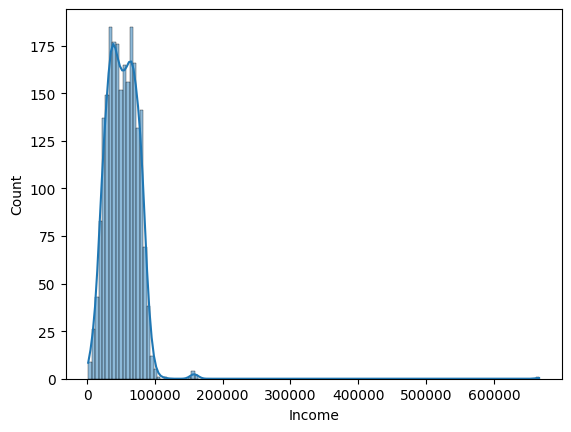

In [7]:
# income dist plot
sns.histplot(x=raw_data.Income, kde=True)
plt.show()

In [8]:
# income mean = 52k
# median
raw_data.Income.median()

51381.5

In [9]:
# fill na values of income with mean
raw_data.Income.fillna(raw_data.Income.mean(skipna=True), inplace=True)

In [10]:
# check na values
raw_data.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

In [11]:
# drop unusable columns
raw_data.drop(columns=["ID","Dt_Customer"], inplace=True)

In [12]:
# show raw data
raw_data

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,Graduation,Single,58138.0,0,0,58,635,88,546,...,7,0,0,0,0,0,0,3,11,1
1,1954,Graduation,Single,46344.0,1,1,38,11,1,6,...,5,0,0,0,0,0,0,3,11,0
2,1965,Graduation,Together,71613.0,0,0,26,426,49,127,...,4,0,0,0,0,0,0,3,11,0
3,1984,Graduation,Together,26646.0,1,0,26,11,4,20,...,6,0,0,0,0,0,0,3,11,0
4,1981,PhD,Married,58293.0,1,0,94,173,43,118,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,1,46,709,43,182,...,5,0,0,0,0,0,0,3,11,0
2236,1946,PhD,Together,64014.0,2,1,56,406,0,30,...,7,0,0,0,1,0,0,3,11,0
2237,1981,Graduation,Divorced,56981.0,0,0,91,908,48,217,...,6,0,1,0,0,0,0,3,11,0
2238,1956,Master,Together,69245.0,0,1,8,428,30,214,...,3,0,0,0,0,0,0,3,11,0


In [13]:
# copy the data and process
process_data = raw_data.copy()

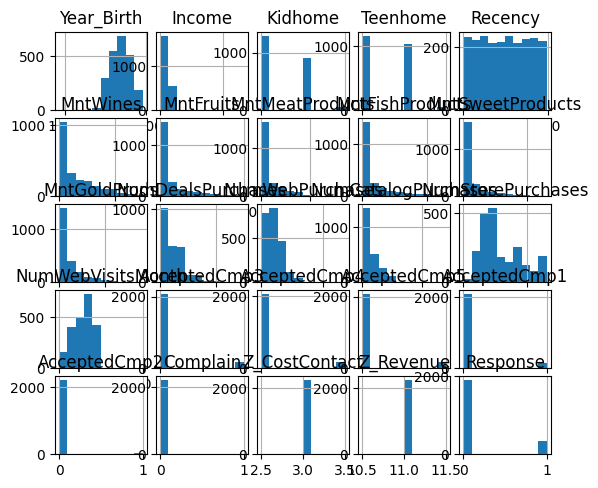

In [14]:
# hist graph
process_data.hist()
plt.subplots_adjust(wspace=0.1, hspace=0.1, bottom=0.0001)
plt.show()

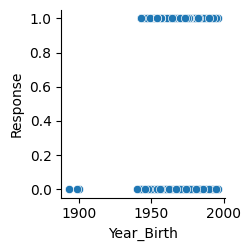

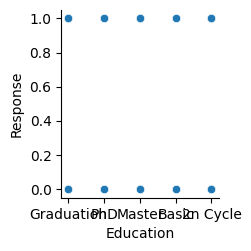

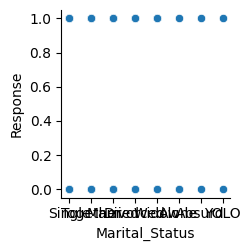

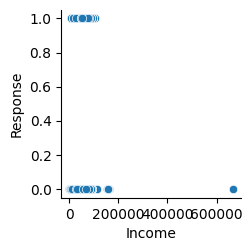

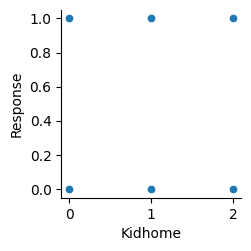

...

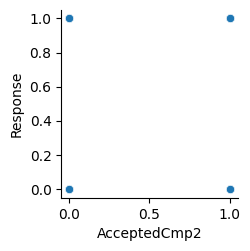

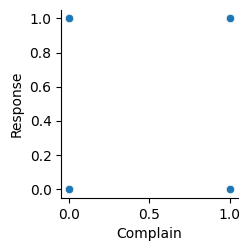

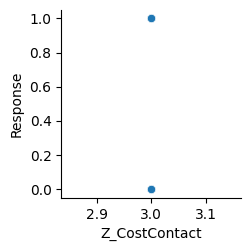

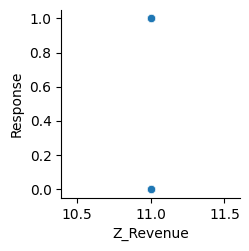

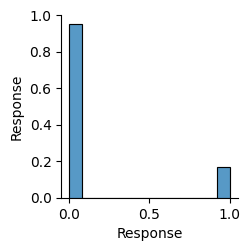

In [45]:
# count plots
for i in process_data.columns:
    sns.pairplot(data=process_data, y_vars="Response", x_vars=f"{i}")
    plt.show()

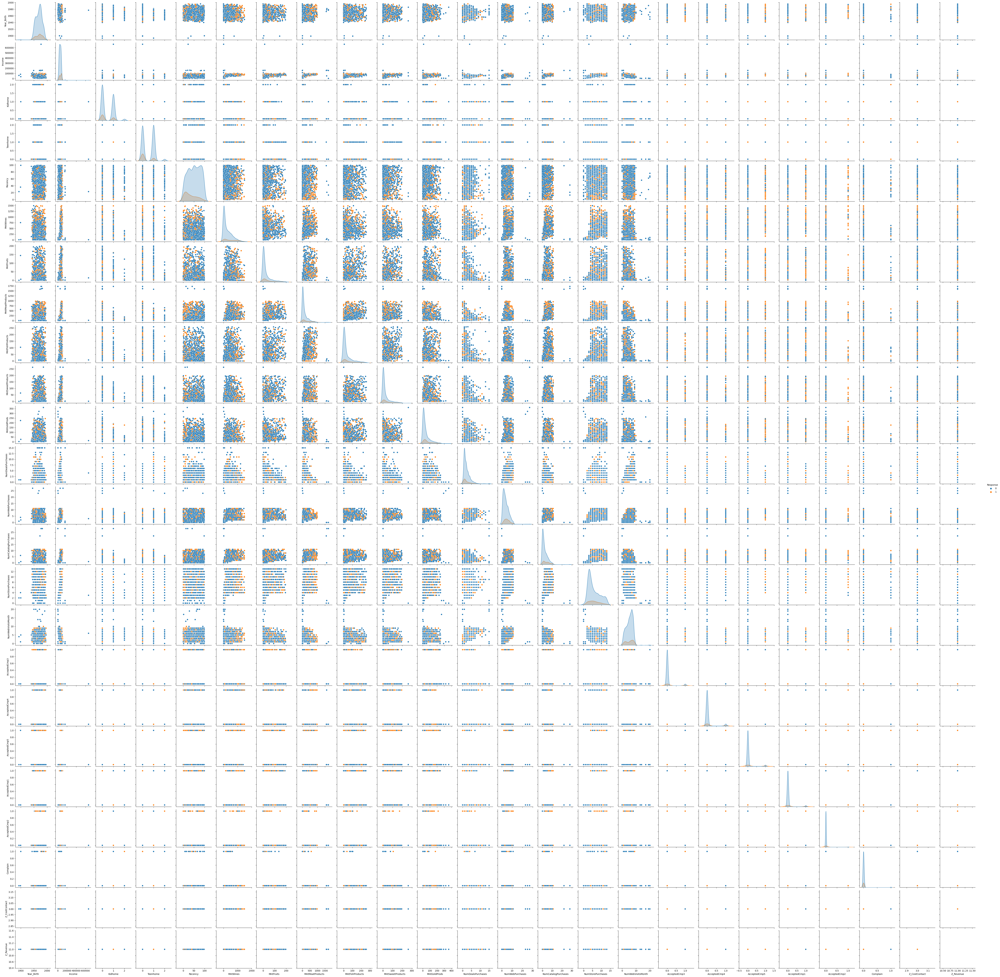

In [47]:
sns.pairplot(data=process_data, hue="Response")
plt.show()

In [15]:
for i in process_data.columns:
    y = eval(f"process_data.{i}.unique()")
    print(y)

[1957 1954 1965 1984 1981 1967 1971 1985 1974 1950 1983 1976 1959 1952
 1987 1946 1980 1949 1982 1979 1951 1969 1986 1989 1963 1970 1973 1943
 1975 1996 1968 1964 1977 1978 1955 1966 1988 1948 1958 1972 1960 1945
 1991 1962 1953 1961 1956 1992 1900 1893 1990 1947 1899 1993 1994 1941
 1944 1995 1940]
['Graduation' 'PhD' 'Master' 'Basic' '2n Cycle']
['Single' 'Together' 'Married' 'Divorced' 'Widow' 'Alone' 'Absurd' 'YOLO']
[58138. 46344. 71613. ... 56981. 69245. 52869.]
[0 1 2]
[0 1 2]
[58 38 26 94 16 34 32 19 68 11 59 82 53 23 51 20 91 86 41 42 63  0 69 89
  4 96 56 31  8 55 37 76 99  3 88 80 72 24 92 39 29  2 54 57 30 12 18 75
 90  1 25 40  9 87  5 95 48 70 79 45 84 44 43 35 15 17 46 27 74 85 65 13
 83 10 21 61 73 47 36 49 28 64 98 78 77 81 14 52 93 50 60 66 97 62  6 33
 67 22 71  7]
[ 635   11  426  173  520  235   76   14   28    5    6  194  233    3
 1006   53   84 1012    4   86    1  867  384  270   36  684    8  112
  110   96  482   40  702   55  437  421   13    9   81  123   

In [16]:
# drop colum which one has only one value
process_data.drop(columns=["Z_CostContact", "Z_Revenue"], inplace=True)
process_data

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,0,58,635,88,546,...,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,1,38,11,1,6,...,1,2,5,0,0,0,0,0,0,0
2,1965,Graduation,Together,71613.0,0,0,26,426,49,127,...,2,10,4,0,0,0,0,0,0,0
3,1984,Graduation,Together,26646.0,1,0,26,11,4,20,...,0,4,6,0,0,0,0,0,0,0
4,1981,PhD,Married,58293.0,1,0,94,173,43,118,...,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,1,46,709,43,182,...,3,4,5,0,0,0,0,0,0,0
2236,1946,PhD,Together,64014.0,2,1,56,406,0,30,...,2,5,7,0,0,0,1,0,0,0
2237,1981,Graduation,Divorced,56981.0,0,0,91,908,48,217,...,3,13,6,0,1,0,0,0,0,0
2238,1956,Master,Together,69245.0,0,1,8,428,30,214,...,5,10,3,0,0,0,0,0,0,0


In [17]:
scale_cols = [i for i in process_data.describe().columns if not i.startswith("Accepted")]
scale_cols

['Year_Birth',
 'Income',
 'Kidhome',
 'Teenhome',
 'Recency',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth',
 'Complain',
 'Response']

In [18]:
scale_cols.remove("Response")

In [19]:

process_data

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,0,58,635,88,546,...,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,1,38,11,1,6,...,1,2,5,0,0,0,0,0,0,0
2,1965,Graduation,Together,71613.0,0,0,26,426,49,127,...,2,10,4,0,0,0,0,0,0,0
3,1984,Graduation,Together,26646.0,1,0,26,11,4,20,...,0,4,6,0,0,0,0,0,0,0
4,1981,PhD,Married,58293.0,1,0,94,173,43,118,...,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,1,46,709,43,182,...,3,4,5,0,0,0,0,0,0,0
2236,1946,PhD,Together,64014.0,2,1,56,406,0,30,...,2,5,7,0,0,0,1,0,0,0
2237,1981,Graduation,Divorced,56981.0,0,0,91,908,48,217,...,3,13,6,0,1,0,0,0,0,0
2238,1956,Master,Together,69245.0,0,1,8,428,30,214,...,5,10,3,0,0,0,0,0,0,0


In [20]:
scale_cols

['Year_Birth',
 'Income',
 'Kidhome',
 'Teenhome',
 'Recency',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth',
 'Complain']

In [61]:
process_2 = process_data.copy()

In [62]:
# min max scaler
process_2[scale_cols] = MinMaxScaler().fit_transform(process_2[scale_cols])
process_2

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,0.621359,Graduation,Single,0.084832,0.0,0.0,0.585859,0.425318,0.442211,0.316522,...,0.357143,0.307692,0.35,0,0,0,0,0,0.0,1
1,0.592233,Graduation,Single,0.067095,0.5,0.5,0.383838,0.007368,0.005025,0.003478,...,0.035714,0.153846,0.25,0,0,0,0,0,0.0,0
2,0.699029,Graduation,Together,0.105097,0.0,0.0,0.262626,0.285332,0.246231,0.073623,...,0.071429,0.769231,0.20,0,0,0,0,0,0.0,0
3,0.883495,Graduation,Together,0.037471,0.5,0.0,0.262626,0.007368,0.020101,0.011594,...,0.000000,0.307692,0.30,0,0,0,0,0,0.0,0
4,0.854369,PhD,Married,0.085065,0.5,0.0,0.949495,0.115874,0.216080,0.068406,...,0.107143,0.461538,0.25,0,0,0,0,0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0.718447,Graduation,Married,0.089472,0.0,0.5,0.464646,0.474883,0.216080,0.105507,...,0.107143,0.307692,0.25,0,0,0,0,0,0.0,0
2236,0.514563,PhD,Together,0.093669,1.0,0.5,0.565657,0.271936,0.000000,0.017391,...,0.071429,0.384615,0.35,0,0,0,1,0,0.0,0
2237,0.854369,Graduation,Divorced,0.083092,0.0,0.0,0.919192,0.608171,0.241206,0.125797,...,0.107143,1.000000,0.30,0,1,0,0,0,0.0,0
2238,0.611650,Master,Together,0.101536,0.0,0.5,0.080808,0.286671,0.150754,0.124058,...,0.178571,0.769231,0.15,0,0,0,0,0,0.0,0


In [63]:
# get dummies
dummy_cols = ["Education", "Marital_Status"]
dummy = pd.get_dummies(data=process_2, columns=dummy_cols, drop_first=True)
dummy

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,Education_Graduation,Education_Master,Education_PhD,Marital_Status_Alone,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,Marital_Status_YOLO
0,0.621359,0.084832,0.0,0.0,0.585859,0.425318,0.442211,0.316522,0.664093,0.334601,...,1,0,0,0,0,0,1,0,0,0
1,0.592233,0.067095,0.5,0.5,0.383838,0.007368,0.005025,0.003478,0.007722,0.003802,...,1,0,0,0,0,0,1,0,0,0
2,0.699029,0.105097,0.0,0.0,0.262626,0.285332,0.246231,0.073623,0.428571,0.079848,...,1,0,0,0,0,0,0,1,0,0
3,0.883495,0.037471,0.5,0.0,0.262626,0.007368,0.020101,0.011594,0.038610,0.011407,...,1,0,0,0,0,0,0,1,0,0
4,0.854369,0.085065,0.5,0.0,0.949495,0.115874,0.216080,0.068406,0.177606,0.102662,...,0,0,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0.718447,0.089472,0.0,0.5,0.464646,0.474883,0.216080,0.105507,0.162162,0.448669,...,1,0,0,0,0,1,0,0,0,0
2236,0.514563,0.093669,1.0,0.5,0.565657,0.271936,0.000000,0.017391,0.000000,0.000000,...,0,0,1,0,0,0,0,1,0,0
2237,0.854369,0.083092,0.0,0.0,0.919192,0.608171,0.241206,0.125797,0.123552,0.045627,...,1,0,0,0,1,0,0,0,0,0
2238,0.611650,0.101536,0.0,0.5,0.080808,0.286671,0.150754,0.124058,0.308880,0.114068,...,0,1,0,0,0,0,0,1,0,0


In [64]:
# null prediction is--> %87 no, %13 yes don't forget

In [65]:
# train test split
y = dummy.pop("Response")
X = dummy
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
# shape control
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((1792, 33), (1792,), (448, 33), (448,))

In [66]:
# metrics creator&lists
def metrics_creator(predicted_value):
    # classification report
    report = classification_report(y_test, predicted_value)
    
    # roc_auc score
    roc_auc = roc_auc_score(y_test, predicted_value)
    
    # confusion matrix
    conf_mat = confusion_matrix(y_test, predicted_value)
    
    print(report, roc_auc, sep="\n")

In [87]:
# grid searcher
def grid_searcher(method, parameter):
    # creat searcher and concat with metrics creator
    searcher = GridSearchCV(estimator=eval(f"{method}"),
                           param_grid=parameter,
                           n_jobs=4,
                           cv=5,
                           scoring="roc_auc",
                           verbose=1)
    # fit searcher
    searcher.fit(X_train, y_train)
    
    # get best parameters
    best = searcher.best_params_
    print(best, searcher.best_score_)
    
    # predict values
    predicted = searcher.predict(X_test)
    
    # metrics 
    metrics_creator(predicted_value=predicted)
    

In [85]:
# logitic reg
method_log_reg = "LogisticRegression()"
param_log_reg = {"solver": ["lbfgs", "liblinear", "newton-cg", "newton-cholesky", "sag", "saga"],
                "penalty": ["l1", "l2", "elasticnet", None],
                "random_state":[40, 10, 20]}

# run searcher
grid_searcher(method_log_reg, param_log_reg)


Fitting 5 folds for each of 72 candidates, totalling 360 fits
              precision    recall  f1-score   support

           0       0.88      0.96      0.92       368
           1       0.70      0.40      0.51        80

    accuracy                           0.86       448
   macro avg       0.79      0.68      0.71       448
weighted avg       0.85      0.86      0.85       448

0.6809782608695651


C:\Users\LENOVO\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
165 fits failed out of a total of 360.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\LENOVO\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\LENOVO\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\LENOVO\AppData\Local\Programs\Python\Python310\lib\site-p

In [88]:
# svm
svm_method = "SVC()"
param_svm = {"C": [1, 10, 30, 50, 100, 500, 1000],
            "gamma": ["scale", "auto", 0.5, 0.7],
            "kernel": ["rbf", "linear", "poly", "sigmoid"]}
grid_searcher(svm_method, param_svm)

Fitting 5 folds for each of 112 candidates, totalling 560 fits
{'C': 10, 'gamma': 'scale', 'kernel': 'linear'} 0.8703313351399192
              precision    recall  f1-score   support

           0       0.87      0.98      0.92       368
           1       0.74      0.31      0.44        80

    accuracy                           0.86       448
   macro avg       0.80      0.64      0.68       448
weighted avg       0.84      0.86      0.83       448

0.6440217391304347


In [89]:
# Rf
rf_method = "RandomForestClassifier()"
param_rf = {"n_estimators": [100, 200, 300, 400, 500],
           "max_features": ["sqrt", "log2", None],
           "max_depth": [3, 5, 7, 10],
           "criterion": ["gini", "entropy", "log_loss"]}

# run rf
grid_searcher(rf_method, param_rf)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
{'criterion': 'log_loss', 'max_depth': 10, 'max_features': 'log2', 'n_estimators': 400} 0.873896268131179
              precision    recall  f1-score   support

           0       0.87      0.99      0.92       368
           1       0.83      0.30      0.44        80

    accuracy                           0.86       448
   macro avg       0.85      0.64      0.68       448
weighted avg       0.86      0.86      0.84       448

0.6432065217391304


In [91]:
# naive bayes
nv_method = "GaussianNB()"

# grid searcher
grid_searcher(nv_method, {})

Fitting 5 folds for each of 1 candidates, totalling 5 fits
{} 0.769624889576796
              precision    recall  f1-score   support

           0       0.94      0.65      0.77       368
           1       0.34      0.82      0.48        80

    accuracy                           0.68       448
   macro avg       0.64      0.74      0.63       448
weighted avg       0.84      0.68      0.72       448

0.7385869565217391


In [93]:
# XGBOOOST
xg_method = "XGBClassifier()"
xg_param = {"n_estimators":[400, 500, 700],
           "max_depth": [3, 5, 7],
           "learning_rate": [1, 2, 0.1, 0.5],
           "random_state": [40]}
grid_searcher(xg_method, xg_param)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
{'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 400, 'random_state': 40} 0.8628565779880206
              precision    recall  f1-score   support

           0       0.90      0.98      0.94       368
           1       0.86      0.53      0.65        80

    accuracy                           0.90       448
   macro avg       0.88      0.75      0.80       448
weighted avg       0.90      0.90      0.89       448

0.7529891304347825


In [94]:
# adaboost
ada_method = "AdaBoostClassifier()"
ada_param = {"n_estimators":[400, 500, 700],
           "learning_rate": [1, 2, 0.1, 0.5],
           "random_state": [40]}
grid_searcher(ada_method, ada_param)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
{'learning_rate': 0.1, 'n_estimators': 500, 'random_state': 40} 0.8583473986574196
              precision    recall  f1-score   support

           0       0.88      0.98      0.93       368
           1       0.80      0.40      0.53        80

    accuracy                           0.88       448
   macro avg       0.84      0.69      0.73       448
weighted avg       0.87      0.88      0.86       448

0.6891304347826086


# AS YOU SEE XGBCLASSIFIER HAS MORE ROC_AUC VALUE THAN OTHER ML ALGORITHMS
